# Ensemble Learning

#### We can build a few models i.e. XGBoost, SVR, CatBoostRegressor and train an LSTM network on the output of each of these to make a prediction on how they predict, and choose the best prediction

In [64]:
import os
import pandas as pd
import numpy as np

from datetime import datetime
from msal import PublicClientApplication

import holidays
from datetime import date

from cognite.client import CogniteClient
from cognite.client.data_classes import TimeSeries, Asset

In [65]:
# Log-in detaljer
TENANT_ID = os.getenv("AZURE_TENANT_ID")
CLIENT_ID = os.getenv("AZURE_CLIENT_ID")
CDF_CLUSTER = "az-power-no-northeurope"
COGNITE_PROJECT = "heco-dev"

# Code to log-in WIHTOUT client_secret
SCOPES = [f"https://{CDF_CLUSTER}.cognitedata.com/.default"]

AUTHORITY_HOST_URI = "https://login.microsoftonline.com"
AUTHORITY_URI = AUTHORITY_HOST_URI + "/" + TENANT_ID
PORT = 53000


def authenticate_azure():

    app = PublicClientApplication(client_id=CLIENT_ID, authority=AUTHORITY_URI)

    # interactive login - make sure you have http://localhost:port in Redirect URI in App Registration as type "Mobile and desktop applications"
    creds = app.acquire_token_interactive(scopes=SCOPES, port=PORT)
    return creds


creds = authenticate_azure()

client = CogniteClient(
    token_url=creds["id_token_claims"]["iss"],
    token=creds["access_token"],
    token_client_id=creds["id_token_claims"]["aud"],
    project=COGNITE_PROJECT,
    base_url=f"https://{CDF_CLUSTER}.cognitedata.com",
    client_name="cognite-python-dev",
)


In [68]:

#Definer ønsket kruver
curves = ["NO2_consumption_per_15min",
"NO2_temperature_per_15min",
"NO2_el_price_per_hour",
"NO2_cloud_coverage_per_15min"
]

#Definer start dato
start_dato = datetime(2015,1,1)
slutt_dato = datetime(2020,1,1)

df_watt = pd.DataFrame()
for curve in curves:
    print(curve)
    hm = client.datapoints.retrieve_dataframe(
        start=start_dato,
        end=slutt_dato,
        aggregates=["average"],
        granularity="1h",
        id=client.time_series.retrieve(external_id=curve).id,)
    df_watt = pd.merge(df_watt, hm, left_index=True, right_index=True, how="outer")

NO2_consumption_per_15min
NO2_temperature_per_15min
NO2_el_price_per_hour
NO2_cloud_coverage_per_15min


In [69]:
start_val = datetime(2020,1,1)
end_val = datetime(2020,1,3)

df_val = pd.DataFrame()
for curve in curves:
    print(curve)
    hm = client.datapoints.retrieve_dataframe(
        start=start_val,
        end=end_val,
        aggregates=["average"],
        granularity="1h",
        id=client.time_series.retrieve(external_id=curve).id,)
    df_val = pd.merge(df_val, hm, left_index=True, right_index=True, how="outer")

df_val

NO2_consumption_per_15min
NO2_temperature_per_15min
NO2_el_price_per_hour
NO2_cloud_coverage_per_15min


,4905473281128395|average,8634628934231505|average,4935457445285399|average,2917416622034538|average
2020-01-01 00:00:00,4162.107251,5.7375,31.77,0.90750
2020-01-01 01:00:00,4129.523040,5.9625,31.57,0.88875
2020-01-01 02:00:00,4056.411425,5.6875,31.28,0.87750
2020-01-01 03:00:00,4058.115149,5.6125,30.72,0.85500
2020-01-01 04:00:00,4069.754585,5.7000,30.27,0.81625
2020-01-01 05:00:00,4163.424268,5.7000,30.17,0.79250
2020-01-01 06:00:00,4263.939965,5.7125,30.14,0.81875
2020-01-01 07:00:00,4341.787254,5.8250,30.49,0.89000
2020-01-01 08:00:00,4418.127605,6.0250,30.59,0.96375
2020-01-01 09:00:00,4524.862413,6.2375,30.27,0.99125


In [70]:
no_holidays = holidays.NO()
periods = pd.date_range(start_dato, slutt_dato, freq="H")
d = np.zeros(len(periods))
e = np.zeros(len(periods))

for l in range(len(periods)):
    a = str(int(periods[l].strftime('%Y%m%d')))

    da = int(a[-2:])
    mo = int(a[-4:-2])
    yr = int(a[-8:-4])
    if date(yr,mo,da) in no_holidays:
        d[l] = 1
    if date(yr,mo,da).weekday() > 4:
        e[l] = 1

df = pd.DataFrame(d,index=[i for i in periods],columns=['holiday?'])
ef = pd.DataFrame(e,index=[i for i in periods],columns=['weekend?'])

df_watt = pd.merge(df_watt, df, left_index=True, right_index=True, how='outer')
df_watt = pd.merge(df_watt, ef, left_index=True, right_index=True, how='outer')


In [71]:
val_periods = pd.date_range(start_val, end_val, freq="H")
d = np.zeros(len(val_periods))
e = np.zeros(len(val_periods))

for l in range(len(val_periods)):
    a = str(int(val_periods[l].strftime('%Y%m%d')))

    da = int(a[-2:])
    mo = int(a[-4:-2])
    yr = int(a[-8:-4])
    if date(yr,mo,da) in no_holidays:
        d[l] = 1
    if date(yr,mo,da).weekday() > 4:
        e[l] = 1

df = pd.DataFrame(d,index=[i for i in val_periods],columns=['holiday?'])
ef = pd.DataFrame(e,index=[i for i in val_periods],columns=['weekend?'])

df_val = pd.merge(df_val, df, left_index=True, right_index=True, how='outer')
df_val = pd.merge(df_val, ef, left_index=True, right_index=True, how='outer')
df_val

,4905473281128395|average,8634628934231505|average,4935457445285399|average,2917416622034538|average,holiday?,weekend?
2020-01-01 00:00:00,4162.107251,5.7375,31.77,0.90750,1.0,0.0
2020-01-01 01:00:00,4129.523040,5.9625,31.57,0.88875,1.0,0.0
2020-01-01 02:00:00,4056.411425,5.6875,31.28,0.87750,1.0,0.0
2020-01-01 03:00:00,4058.115149,5.6125,30.72,0.85500,1.0,0.0
2020-01-01 04:00:00,4069.754585,5.7000,30.27,0.81625,1.0,0.0
2020-01-01 05:00:00,4163.424268,5.7000,30.17,0.79250,1.0,0.0
2020-01-01 06:00:00,4263.939965,5.7125,30.14,0.81875,1.0,0.0
2020-01-01 07:00:00,4341.787254,5.8250,30.49,0.89000,1.0,0.0
2020-01-01 08:00:00,4418.127605,6.0250,30.59,0.96375,1.0,0.0
2020-01-01 09:00:00,4524.862413,6.2375,30.27,0.99125,1.0,0.0


In [72]:
df_watt.columns = ["cons_actual","temp_forecast", "price_forecast", "cc_forecast", "holiday", "weekend"]
df_val.columns = ["cons_actual","temp_forecast", "price_forecast", "cc_forecast", "holiday", "weekend"]
df_watt.head(3)

,cons_actual,temp_forecast,price_forecast,cc_forecast,holiday,weekend
2015-01-01 00:00:00,4155.337456,6.0125,27.07,0.9775,1.0,0.0
2015-01-01 01:00:00,4057.428047,6.1125,26.93,0.9575,1.0,0.0
2015-01-01 02:00:00,3977.633167,6.2250,26.83,0.9400,1.0,0.0


## Preprocessing

In [73]:
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt

from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

#### Adding Day- and Week- cos and sin

In [74]:
df_watt['Seconds'] = df_watt.index.map(pd.Timestamp.timestamp)
day = 60*60*24
year = 365.2425*day
week = day*7

df_watt['Day sin'] = np.sin(df_watt['Seconds'] * (2* np.pi / day))
df_watt['Day cos'] = np.cos(df_watt['Seconds'] * (2 * np.pi / day))
df_watt['Week sin'] = np.sin(df_watt['Seconds'] * (2 * np.pi / week))
df_watt['Week cos'] = np.cos(df_watt['Seconds'] * (2 * np.pi / week))
df_watt['Year sin'] = np.sin(df_watt['Seconds'] * (2 * np.pi / year))
df_watt['Year cos'] = np.cos(df_watt['Seconds'] * (2 * np.pi / year))

df_watt=df_watt.drop(['Seconds'], axis=1)
df_watt

,cons_actual,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2015-01-01 00:00:00,4155.337456,6.0125,27.07,0.97750,1.0,0.0,1.232357e-12,1.000000,-6.035158e-13,1.000000,0.001505,0.999999
2015-01-01 01:00:00,4057.428047,6.1125,26.93,0.95750,1.0,0.0,2.588190e-01,0.965926,3.739119e-02,0.999301,0.002222,0.999998
2015-01-01 02:00:00,3977.633167,6.2250,26.83,0.94000,1.0,0.0,5.000000e-01,0.866025,7.473009e-02,0.997204,0.002939,0.999996
2015-01-01 03:00:00,3930.312798,6.4250,26.81,0.94000,1.0,0.0,7.071068e-01,0.707107,1.119645e-01,0.993712,0.003656,0.999993
2015-01-01 04:00:00,3950.209133,6.6125,26.97,0.94000,1.0,0.0,8.660254e-01,0.500000,1.490423e-01,0.988831,0.004372,0.999990
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 20:00:00,4564.561243,5.1625,33.17,0.73125,0.0,0.0,-8.660254e-01,0.500000,-8.660254e-01,0.500000,-0.005017,0.999987
2019-12-31 21:00:00,4365.100158,5.6125,32.75,0.74875,0.0,0.0,-7.071068e-01,0.707107,-8.467242e-01,0.532032,-0.004301,0.999991
2019-12-31 22:00:00,4287.215715,5.7000,32.56,0.81875,0.0,0.0,-5.000000e-01,0.866025,-8.262388e-01,0.563320,-0.003584,0.999994
2019-12-31 23:00:00,4309.548467,5.7000,31.82,0.88375,0.0,0.0,-2.588190e-01,0.965926,-8.045978e-01,0.593820,-0.002867,0.999996


In [75]:
df_val['Seconds'] = df_val.index.map(pd.Timestamp.timestamp)
day = 60*60*24
year = 365.2425*day
week = day*7

df_val['Day sin'] = np.sin(df_val['Seconds'] * (2* np.pi / day))
df_val['Day cos'] = np.cos(df_val['Seconds'] * (2 * np.pi / day))
df_val['Week sin'] = np.sin(df_val['Seconds'] * (2 * np.pi / week))
df_val['Week cos'] = np.cos(df_val['Seconds'] * (2 * np.pi / week))
df_val['Year sin'] = np.sin(df_val['Seconds'] * (2 * np.pi / year))
df_val['Year cos'] = np.cos(df_val['Seconds'] * (2 * np.pi / year))

df_val=df_val.drop(['Seconds'], axis=1)
df_val

,cons_actual,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2020-01-01 00:00:00,4162.107251,5.7375,31.77,0.90750,1.0,0.0,-7.670342e-12,1.000000e+00,-7.818315e-01,0.623490,-2.150345e-03,0.999998
2020-01-01 01:00:00,4129.523040,5.9625,31.57,0.88875,1.0,0.0,2.588190e-01,9.659258e-01,-7.579717e-01,0.652287,-1.433564e-03,0.999999
2020-01-01 02:00:00,4056.411425,5.6875,31.28,0.87750,1.0,0.0,5.000000e-01,8.660254e-01,-7.330519e-01,0.680173,-7.167823e-04,1.000000
2020-01-01 03:00:00,4058.115149,5.6125,30.72,0.85500,1.0,0.0,7.071068e-01,7.071068e-01,-7.071068e-01,0.707107,1.964387e-15,1.000000
2020-01-01 04:00:00,4069.754585,5.7000,30.27,0.81625,1.0,0.0,8.660254e-01,5.000000e-01,-6.801727e-01,0.733052,7.167823e-04,1.000000
2020-01-01 05:00:00,4163.424268,5.7000,30.17,0.79250,1.0,0.0,9.659258e-01,2.588190e-01,-6.522874e-01,0.757972,1.433564e-03,0.999999
2020-01-01 06:00:00,4263.939965,5.7125,30.14,0.81875,1.0,0.0,1.000000e+00,1.023369e-11,-6.234898e-01,0.781831,2.150345e-03,0.999998
2020-01-01 07:00:00,4341.787254,5.8250,30.49,0.89000,1.0,0.0,9.659258e-01,-2.588190e-01,-5.938202e-01,0.804598,2.867126e-03,0.999996
2020-01-01 08:00:00,4418.127605,6.0250,30.59,0.96375,1.0,0.0,8.660254e-01,-5.000000e-01,-5.633201e-01,0.826239,3.583904e-03,0.999994
2020-01-01 09:00:00,4524.862413,6.2375,30.27,0.99125,1.0,0.0,7.071068e-01,-7.071068e-01,-5.320321e-01,0.846724,4.300681e-03,0.999991


In [76]:
df_watt_copy = df_watt
df_watt.dropna(inplace=True)
df_val.dropna(inplace=True)
df_watt

,cons_actual,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2015-01-01 00:00:00,4155.337456,6.0125,27.07,0.97750,1.0,0.0,1.232357e-12,1.000000,-6.035158e-13,1.000000,0.001505,0.999999
2015-01-01 01:00:00,4057.428047,6.1125,26.93,0.95750,1.0,0.0,2.588190e-01,0.965926,3.739119e-02,0.999301,0.002222,0.999998
2015-01-01 02:00:00,3977.633167,6.2250,26.83,0.94000,1.0,0.0,5.000000e-01,0.866025,7.473009e-02,0.997204,0.002939,0.999996
2015-01-01 03:00:00,3930.312798,6.4250,26.81,0.94000,1.0,0.0,7.071068e-01,0.707107,1.119645e-01,0.993712,0.003656,0.999993
2015-01-01 04:00:00,3950.209133,6.6125,26.97,0.94000,1.0,0.0,8.660254e-01,0.500000,1.490423e-01,0.988831,0.004372,0.999990
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,4576.174025,4.7500,33.54,0.78250,0.0,0.0,-9.659258e-01,0.258819,-8.841154e-01,0.467269,-0.005734,0.999984
2019-12-31 20:00:00,4564.561243,5.1625,33.17,0.73125,0.0,0.0,-8.660254e-01,0.500000,-8.660254e-01,0.500000,-0.005017,0.999987
2019-12-31 21:00:00,4365.100158,5.6125,32.75,0.74875,0.0,0.0,-7.071068e-01,0.707107,-8.467242e-01,0.532032,-0.004301,0.999991
2019-12-31 22:00:00,4287.215715,5.7000,32.56,0.81875,0.0,0.0,-5.000000e-01,0.866025,-8.262388e-01,0.563320,-0.003584,0.999994


In [77]:
train_cols = list(df_watt)[1:]
#New dataframe with only training data - 4 columns
df_for_training = df_watt[train_cols].astype(float)
df_for_training

,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2015-01-01 00:00:00,6.0125,27.07,0.97750,1.0,0.0,1.232357e-12,1.000000,-6.035158e-13,1.000000,0.001505,0.999999
2015-01-01 01:00:00,6.1125,26.93,0.95750,1.0,0.0,2.588190e-01,0.965926,3.739119e-02,0.999301,0.002222,0.999998
2015-01-01 02:00:00,6.2250,26.83,0.94000,1.0,0.0,5.000000e-01,0.866025,7.473009e-02,0.997204,0.002939,0.999996
2015-01-01 03:00:00,6.4250,26.81,0.94000,1.0,0.0,7.071068e-01,0.707107,1.119645e-01,0.993712,0.003656,0.999993
2015-01-01 04:00:00,6.6125,26.97,0.94000,1.0,0.0,8.660254e-01,0.500000,1.490423e-01,0.988831,0.004372,0.999990
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,4.7500,33.54,0.78250,0.0,0.0,-9.659258e-01,0.258819,-8.841154e-01,0.467269,-0.005734,0.999984
2019-12-31 20:00:00,5.1625,33.17,0.73125,0.0,0.0,-8.660254e-01,0.500000,-8.660254e-01,0.500000,-0.005017,0.999987
2019-12-31 21:00:00,5.6125,32.75,0.74875,0.0,0.0,-7.071068e-01,0.707107,-8.467242e-01,0.532032,-0.004301,0.999991
2019-12-31 22:00:00,5.7000,32.56,0.81875,0.0,0.0,-5.000000e-01,0.866025,-8.262388e-01,0.563320,-0.003584,0.999994


In [78]:
X = df_watt[train_cols]
y = df_watt['cons_actual']
train_x, test_x, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=None) #change random_state if you want to split randomly

train_x

,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2015-09-15 05:00:00,13.9000,15.61,1.00000,0.0,0.0,0.965926,0.258819,-0.999301,-0.037391,-0.959327,-0.282296
2017-08-03 08:00:00,14.3250,27.26,0.91000,0.0,0.0,0.866025,-0.500000,0.294755,0.955573,-0.527708,-0.849426
2017-08-11 22:00:00,14.9000,25.63,0.97250,0.0,0.0,-0.500000,0.866025,0.988831,-0.149042,-0.646935,-0.762545
2016-08-21 19:00:00,16.1375,22.79,0.78375,0.0,1.0,-0.965926,0.258819,-0.258819,-0.965926,-0.769212,-0.638994
2018-01-28 09:00:00,5.5500,28.68,0.82625,0.0,1.0,0.707107,-0.707107,0.111964,-0.993712,0.459222,0.888322
...,...,...,...,...,...,...,...,...,...,...,...
2019-03-09 09:00:00,3.1375,44.99,1.00000,0.0,1.0,0.707107,-0.707107,0.846724,-0.532032,0.917225,0.398369
2015-03-11 09:00:00,6.4500,25.99,0.02875,0.0,0.0,0.707107,-0.707107,-0.532032,0.846724,0.930197,0.367062
2016-08-22 02:00:00,14.8625,19.90,0.63625,0.0,0.0,0.500000,0.866025,-0.500000,-0.866025,-0.772408,-0.635126
2017-08-13 04:00:00,11.7375,12.16,0.29250,0.0,1.0,0.866025,0.500000,0.294755,-0.955573,-0.663181,-0.748459


# XGBoostRegressor

In [79]:

xgb = XGBRegressor(n_estimators=1000, learning_rate=0.1, max_depth=5)
xgb.fit(train_x, train_y, eval_set=[(train_x, train_y), (test_x, test_y)], eval_metric="mae", early_stopping_rounds=5)


[0]	validation_0-mae:3642.35925	validation_1-mae:3642.27532
[1]	validation_0-mae:3278.42175	validation_1-mae:3278.25315
[2]	validation_0-mae:2950.86478	validation_1-mae:2950.44268
[3]	validation_0-mae:2656.00962	validation_1-mae:2655.43916
[4]	validation_0-mae:2390.65261	validation_1-mae:2390.22905
[5]	validation_0-mae:2151.79791	validation_1-mae:2151.04440
[6]	validation_0-mae:1936.80969	validation_1-mae:1936.23509
[7]	validation_0-mae:1743.31577	validation_1-mae:1742.75138
[8]	validation_0-mae:1569.14184	validation_1-mae:1568.56062
[9]	validation_0-mae:1412.36632	validation_1-mae:1411.66377
[10]	validation_0-mae:1271.25997	validation_1-mae:1270.59128
[11]	validation_0-mae:1144.25442	validation_1-mae:1143.62928


c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\xgboost\sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mae:1029.93410	validation_1-mae:1029.39177
[13]	validation_0-mae:927.03432	validation_1-mae:926.37198
[14]	validation_0-mae:834.42310	validation_1-mae:833.78445
[15]	validation_0-mae:751.07480	validation_1-mae:750.40682
[16]	validation_0-mae:676.07575	validation_1-mae:675.52660
[17]	validation_0-mae:608.58501	validation_1-mae:608.09824
[18]	validation_0-mae:547.87678	validation_1-mae:547.34469
[19]	validation_0-mae:493.29848	validation_1-mae:492.70728
[20]	validation_0-mae:444.27177	validation_1-mae:443.62704
[21]	validation_0-mae:400.26365	validation_1-mae:399.58262
[22]	validation_0-mae:360.89701	validation_1-mae:360.22434
[23]	validation_0-mae:325.69690	validation_1-mae:325.11083
[24]	validation_0-mae:294.51545	validation_1-mae:294.04209
[25]	validation_0-mae:266.86854	validation_1-mae:266.63977
[26]	validation_0-mae:242.47825	validation_1-mae:242.42707
[27]	validation_0-mae:221.10590	validation_1-mae:221.25898
[28]	validation_0-mae:202.54869	validation_1-mae:203.1

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

In [80]:
val_x = df_val[train_cols]
val_y = df_val['cons_actual']
val_y

train_cols

['temp_forecast',
 'price_forecast',
 'cc_forecast',
 'holiday',
 'weekend',
 'Day sin',
 'Day cos',
 'Week sin',
 'Week cos',
 'Year sin',
 'Year cos']

In [81]:
xgb_pred = xgb.predict(val_x)

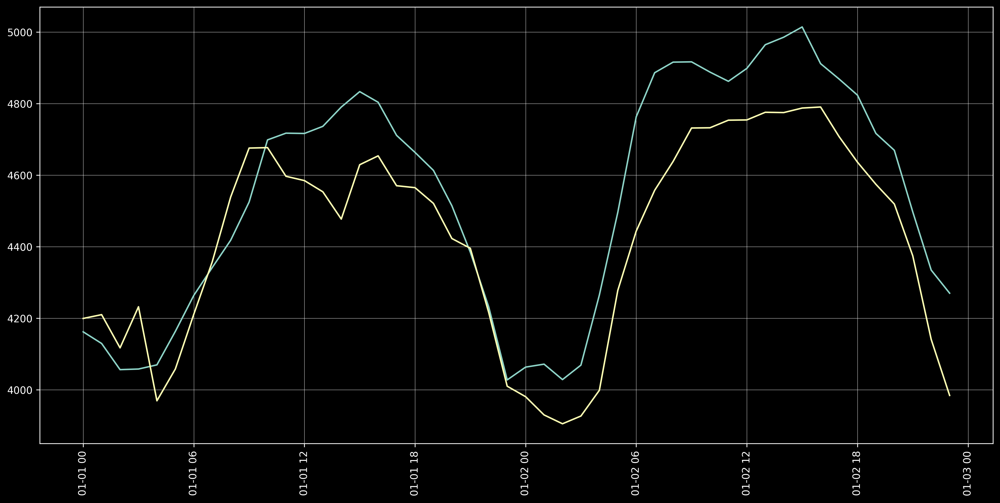

In [82]:
plt.style.use('dark_background')
plt.rcParams.update({'figure.figsize': (17, 8), 'figure.dpi':300})
fig, ax = plt.subplots()
plt.plot(val_y.index,val_y)
plt.plot(val_y.index, xgb_pred)
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

<BarContainer object of 11 artists>

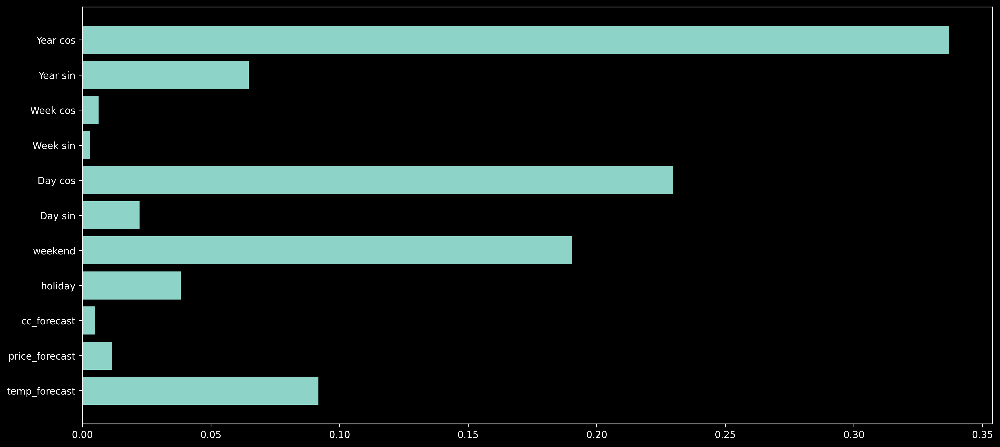

In [83]:
feature_importance = xgb.feature_importances_
plt.barh(df_watt.columns[1:], feature_importance)

# CatBoostRegressor

In [84]:
import catboost as cb
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance

In [85]:
train_dataset = cb.Pool(train_x, train_y)
test_dataset = cb.Pool(test_x, test_y)

cbr = cb.CatBoostRegressor(loss_function='RMSE')

grid = {
    'iterations': [100, 150, 200],
    'learning_rate': [0.03, 0.1],
    'depth': [2, 4, 6, 8],
    'l2_leaf_reg': [0.2, 0.5, 1, 3]
}

cbr.grid_search(grid, train_dataset)

0:	learn: 3992.6051404	test: 4003.6329774	best: 4003.6329774 (0)	total: 4.21ms	remaining: 417ms
1:	learn: 3874.3097405	test: 3884.8957955	best: 3884.8957955 (1)	total: 7.42ms	remaining: 364ms
2:	learn: 3760.0651905	test: 3770.1022191	best: 3770.1022191 (2)	total: 9.31ms	remaining: 301ms
3:	learn: 3649.8464044	test: 3659.6750909	best: 3659.6750909 (3)	total: 11.9ms	remaining: 286ms
4:	learn: 3542.4238318	test: 3551.9226141	best: 3551.9226141 (4)	total: 13.7ms	remaining: 260ms
5:	learn: 3438.1813200	test: 3447.2659400	best: 3447.2659400 (5)	total: 16.3ms	remaining: 256ms
6:	learn: 3337.2458421	test: 3345.9124162	best: 3345.9124162 (6)	total: 18.6ms	remaining: 248ms
7:	learn: 3239.2585288	test: 3247.5138727	best: 3247.5138727 (7)	total: 20.3ms	remaining: 233ms
8:	learn: 3144.7316510	test: 3152.8224299	best: 3152.8224299 (8)	total: 22.2ms	remaining: 225ms
9:	learn: 3052.5646474	test: 3060.2885592	best: 3060.2885592 (9)	total: 25.5ms	remaining: 230ms
10:	learn: 2963.3583396	test: 2970.71217

{'params': {'depth': 8,
  'iterations': 200,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.2},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

Testing Performance
RMSE: 148.77
R2: 0.79


<BarContainer object of 11 artists>

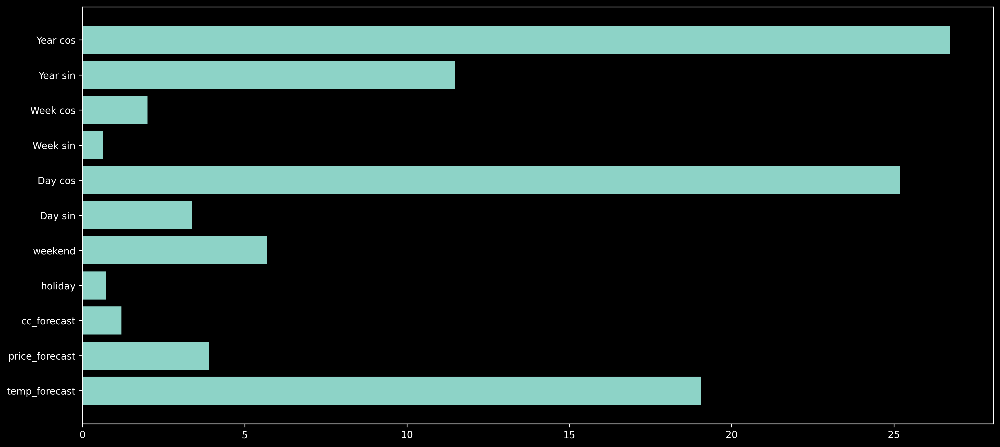

In [86]:
pred = cbr.predict(val_x)
rmse = (np.sqrt(mean_squared_error(val_y, pred)))
r2 = r2_score(val_y, pred)

print('Testing Performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

plt.barh(df_watt.columns[1:], cbr.feature_importances_)

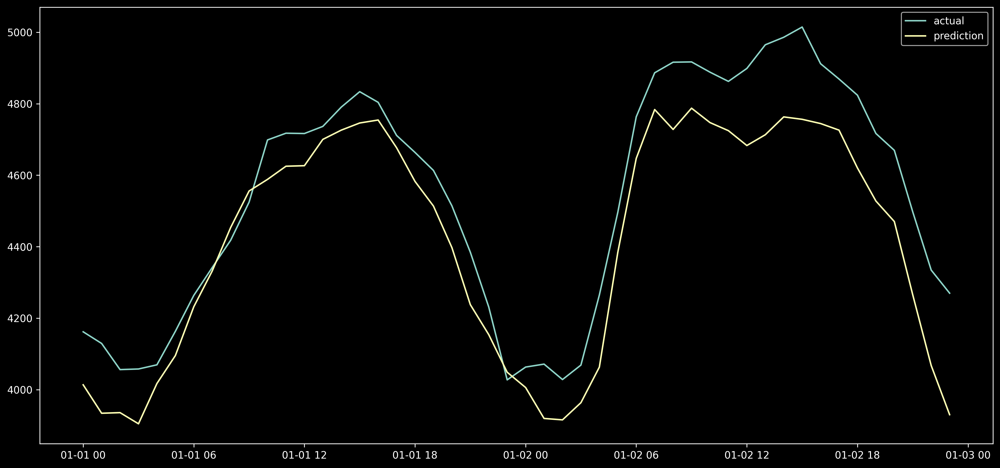

In [87]:
cbr_pred = cbr.predict(val_x)
plt.plot(val_y, label='actual')
plt.plot(val_y.index,cbr_pred, label='prediction')
plt.legend()

# SupportVectorRegressor (Linear because of the amount of data used)

#### The following models needs Standardized data for training

In [88]:
from sklearn.svm import LinearSVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

In [89]:
train_scaler = StandardScaler()
train_scaler.fit(df_watt)
scaled_df = train_scaler.transform(df_watt_copy)
scaled_df = pd.DataFrame(scaled_df, index=df_watt.index, columns=list(df_watt)[0:])

scaled_x = scaled_df[train_cols]
scaled_y = scaled_df['cons_actual']

df_val_copy=df_val
val_scaler = StandardScaler()
val_scaler = val_scaler.fit(df_val)
scaled_val_df = val_scaler.transform(df_val_copy)
scaled_val_df = pd.DataFrame(scaled_val_df, index=df_val.index, columns=list(df_val)[0:])

scaled_val_x = scaled_val_df[train_cols]
scaled_val_y = scaled_val_df['cons_actual']

In [90]:
"""param_grid_svr={
    'C': [1, 10, 100],
    'epsilon':[0,1],
    'tol':[1e-3, 1e-1],
    'max_iter':[2000]
}
grid_svr = GridSearchCV(LinearSVR(), param_grid_svr, refit=True, verbose=2)"""

svr = LinearSVR(C = 1, epsilon=0, tol=1e-3, max_iter=1500)
svr.fit(scaled_x, scaled_y)

LinearSVR(C=1, epsilon=0, max_iter=1500, tol=0.001)

In [91]:
df_watt.shape

(43812, 12)

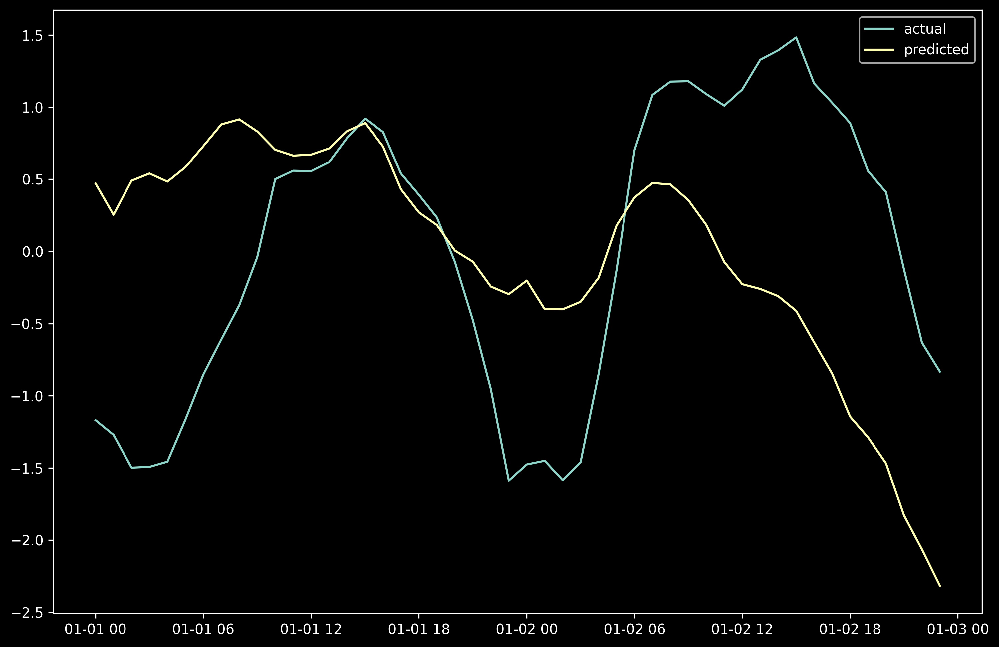

In [92]:
svr_pred_scaled = svr.predict(scaled_val_x)


plt.figure(figsize=(12,8))
plt.plot(scaled_val_y, label='actual')
plt.plot(val_y.index, svr_pred_scaled, label='predicted')
plt.legend()

# MLPRegressor

In [93]:
from sklearn.neural_network import MLPRegressor

"""param_grid_mlp={
    'hidden_layer_sizes': [64, 128, 256],
    'activation': ['tanh', 'relu'],
    'early_stopping':[True]
}
grid_mlp = GridSearchCV(MLPRegressor(), param_grid_mlp, verbose=3)
grid_mlp.fit(scaled_x, scaled_y)"""

mlp = MLPRegressor(hidden_layer_sizes=256, activation='relu', early_stopping=True)
mlp.fit(scaled_x, scaled_y)


c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\57861\.conda\envs\p39_sommer\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\57861\.conda\envs\p39_sommer\lib\sit

MLPRegressor(early_stopping=True, hidden_layer_sizes=256)

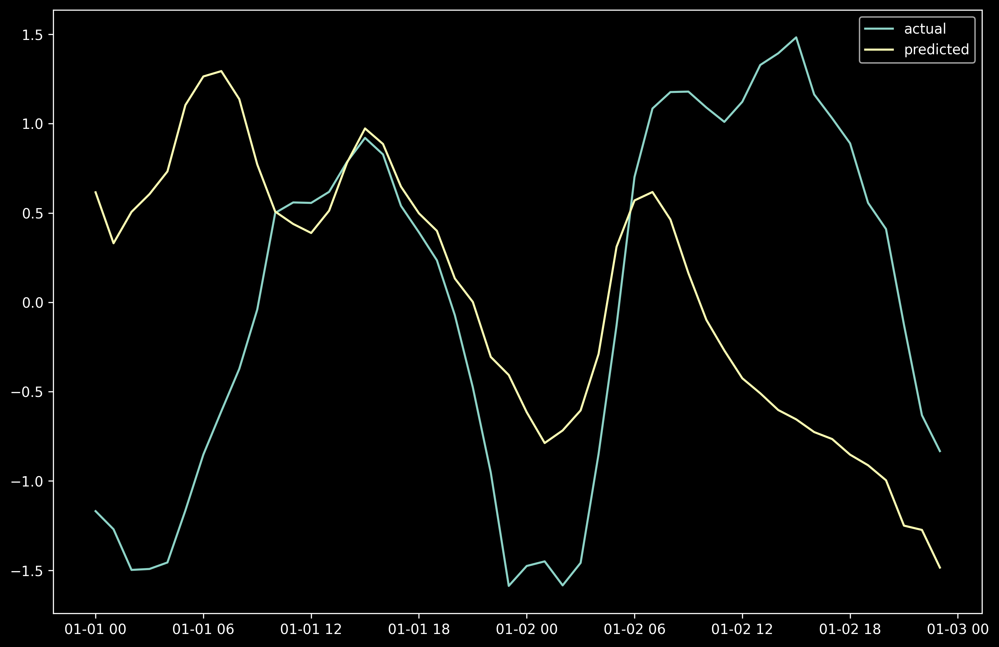

In [94]:
mlp_pred_scaled = mlp.predict(scaled_val_x)
plt.figure(figsize=(12,8))
plt.plot(scaled_val_y, label='actual')
plt.plot(val_y.index, mlp_pred_scaled, label='predicted')
plt.legend()

### Its possible i did something wrong wih SVR and MLPR since the plots are similar, but I will look into that later. Lets try to train a LSTM on the outputs of each of the working vmodels

In [95]:
import wapi # wattsights egen pakke / den må installers via `pip install wapi-python`
import pandas as pd
import os
import numpy as np
from datetime import datetime 
from datetime import timedelta

# Create a session
# Dette forutsetter at dere har lagret volue credentials som miljøvariabler på PC'en deres og med navnet `WS_CLIENT_ID` og `WS_CLIENT_SECRET`
user = os.getenv("WS_CLIENT_ID")
password = os.getenv("WS_CLIENT_SECRET")
session = wapi.Session(client_id=user, client_secret=password)

start = "2020-01-01"
end = "2022-06-06"
periods=pd.date_range(start,end,freq='D')

# Retrieve volue prediction model
curves = [
    'con no2 ec00 mwh/h cet min15 f'
    ]



df_cons = pd.DataFrame()
for curve in curves:
    print(f"Working with {curve}")
    curve = session.get_curve(name=curve)
    curve_type = curve.curve_type
    res = []
    counter = 1
    if curve_type == 'TIME_SERIES':
        ts = curve.get_data(data_from=start, data_to=end, function='SAVERAGE', frequency='H')
        cons_temp = ts.to_pandas()
        df_cons = pd.merge(df_cons, cons_temp, left_index=True, right_index=True, how='outer')
        continue
    
    for j in range(len(periods)):
        if j == len(periods)-1:
            continue
        if curve_type == 'TAGGED_INSTANCES':
            ts_list = curve.search_instances(issue_date_from=periods[j],
                                 issue_date_to=periods[j+1],
                                 with_data=True, function='SAVERAGE', frequency='H', tags=['Avg'])
        else: #curve_type == 'INSTANCES'
            ts_list = curve.search_instances(issue_date_from=periods[j],
                                 issue_date_to=periods[j+1],
                                 with_data=True, function='SAVERAGE', frequency='H')
        # check if ts_list is empty and if yes, jump over that timestamp
        if not ts_list:
            continue
        pd_s = ts_list[0].to_pandas()
        if pd_s.empty:
            continue
        pd_s = pd_s.sort_index(ascending=True)
        pd_s = pd_s[:24]
        res.append(pd_s)
        print(f'Done {counter} out of {len(periods)}')
        counter += 1

    for k in range(len(res)):
        if k == 0:
            cons = pd.Series(res[k])
        else:
            cons = pd.concat([cons, res[k]])
    cons_temp = cons.rename(curve)
    df_cons = pd.merge(df_cons, cons_temp, left_index=True, right_index=True, how='outer')


Working with con no2 ec00 mwh/h cet min15 f
Done 1 out of 888
Done 2 out of 888
Done 3 out of 888
Done 4 out of 888
Done 5 out of 888
Done 6 out of 888
Done 7 out of 888
Done 8 out of 888
Done 9 out of 888
Done 10 out of 888
Done 11 out of 888
Done 12 out of 888
Done 13 out of 888
Done 14 out of 888
Done 15 out of 888
Done 16 out of 888
Done 17 out of 888
Done 18 out of 888
Done 19 out of 888
Done 20 out of 888
Done 21 out of 888
Done 22 out of 888
Done 23 out of 888
Done 24 out of 888
Done 25 out of 888
Done 26 out of 888
Done 27 out of 888
Done 28 out of 888
Done 29 out of 888
Done 30 out of 888
Done 31 out of 888
Done 32 out of 888
Done 33 out of 888
Done 34 out of 888
Done 35 out of 888
Done 36 out of 888
Done 37 out of 888
Done 38 out of 888
Done 39 out of 888
Done 40 out of 888
Done 41 out of 888
Done 42 out of 888
Done 43 out of 888
Done 44 out of 888
Done 45 out of 888
Done 46 out of 888
Done 47 out of 888
Done 48 out of 888
Done 49 out of 888
Done 50 out of 888
Done 51 out of 

In [96]:
df_cons.columns = ['volue_cons']
df_cons = df_cons.iloc[1:, :]
df_cons

,volue_cons
2020-01-01 00:00:00+01:00,4315.219520
2020-01-01 01:00:00+01:00,4231.366035
2020-01-01 02:00:00+01:00,4159.397837
2020-01-01 03:00:00+01:00,4128.932301
2020-01-01 04:00:00+01:00,4143.490198
...,...
2022-06-05 19:00:00+02:00,3451.947372
2022-06-05 20:00:00+02:00,3474.536051
2022-06-05 21:00:00+02:00,3517.588927
2022-06-05 22:00:00+02:00,3510.128630


## We need x and y for the period we are training on

In [98]:
from datetime import date

#Definer ønsket kruver
curves = ["NO2_consumption_per_15min",
"NO2_temperature_per_15min",
"NO2_el_price_per_hour",
"NO2_cloud_coverage_per_15min"
]

#Definer start dato
start_dato = datetime(2020,1,1)
slutt_dato = datetime(2022,6,6)

df_new = pd.DataFrame()
for curve in curves:
    print(curve)
    hm = client.datapoints.retrieve_dataframe(
        start=start_dato,
        end=slutt_dato,
        aggregates=["average"],
        granularity="1h",
        id=client.time_series.retrieve(external_id=curve).id,)
    df_new = pd.merge(df_new, hm, left_index=True, right_index=True, how="outer")

# Add holidays
no_holidays = holidays.NO()
periods = pd.date_range(start_dato, slutt_dato, freq="H")
d = np.zeros(len(periods))
e = np.zeros(len(periods))

for l in range(len(periods)):
    a = str(int(periods[l].strftime('%Y%m%d')))

    da = int(a[-2:])
    mo = int(a[-4:-2])
    yr = int(a[-8:-4])
    if date(yr,mo,da) in no_holidays:
        d[l] = 1
    if date(yr,mo,da).weekday() > 4:
        e[l] = 1

df = pd.DataFrame(d,index=[i for i in periods],columns=['holiday?'])
ef = pd.DataFrame(e,index=[i for i in periods],columns=['weekend?'])

df_new = pd.merge(df_new, df, left_index=True, right_index=True, how='outer')
df_new = pd.merge(df_new, ef, left_index=True, right_index=True, how='outer')

df_new.columns = ["cons_actual","temp_forecast", "price_forecast", "cc_forecast", "holiday", "weekend"]

df_new['Seconds'] = df_new.index.map(pd.Timestamp.timestamp)
day = 60*60*24
year = 365.2425*day
week = day*7

df_new['Day sin'] = np.sin(df_new['Seconds'] * (2* np.pi / day))
df_new['Day cos'] = np.cos(df_new['Seconds'] * (2 * np.pi / day))
df_new['Week sin'] = np.sin(df_new['Seconds'] * (2 * np.pi / week))
df_new['Week cos'] = np.cos(df_new['Seconds'] * (2 * np.pi / week))
df_new['Year sin'] = np.sin(df_new['Seconds'] * (2 * np.pi / year))
df_new['Year cos'] = np.cos(df_new['Seconds'] * (2 * np.pi / year))

df_new=df_new.drop(['Seconds'], axis=1)


NO2_consumption_per_15min
NO2_temperature_per_15min
NO2_el_price_per_hour
NO2_cloud_coverage_per_15min


In [99]:
df_new_copy = df_new
df_new.dropna(inplace=True)
df_new

,cons_actual,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2020-01-01 00:00:00,4162.107251,5.7375,31.77,0.90750,1.0,0.0,-7.670342e-12,1.000000,-0.781831,0.623490,-2.150345e-03,0.999998
2020-01-01 01:00:00,4129.523040,5.9625,31.57,0.88875,1.0,0.0,2.588190e-01,0.965926,-0.757972,0.652287,-1.433564e-03,0.999999
2020-01-01 02:00:00,4056.411425,5.6875,31.28,0.87750,1.0,0.0,5.000000e-01,0.866025,-0.733052,0.680173,-7.167823e-04,1.000000
2020-01-01 03:00:00,4058.115149,5.6125,30.72,0.85500,1.0,0.0,7.071068e-01,0.707107,-0.707107,0.707107,1.964387e-15,1.000000
2020-01-01 04:00:00,4069.754585,5.7000,30.27,0.81625,1.0,0.0,8.660254e-01,0.500000,-0.680173,0.733052,7.167823e-04,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-05 19:00:00,3402.250000,12.0625,161.20,0.59625,1.0,1.0,-9.659258e-01,0.258819,-0.258819,-0.965926,4.393134e-01,-0.898334
2022-06-05 20:00:00,3376.000000,10.9875,160.18,0.71750,1.0,1.0,-8.660254e-01,0.500000,-0.294755,-0.955573,4.386694e-01,-0.898649
2022-06-05 21:00:00,3366.375000,10.1000,141.63,0.77375,1.0,1.0,-7.071068e-01,0.707107,-0.330279,-0.943883,4.380252e-01,-0.898963
2022-06-05 22:00:00,3288.000000,9.3250,106.70,0.80000,1.0,1.0,-5.000000e-01,0.866025,-0.365341,-0.930874,4.373807e-01,-0.899276


# We need the same number of rows in the dfs

In [100]:
t = np.array(df_cons.index)
for i, timestamp in enumerate(df_cons.index):
    t[i] = (timestamp.tz_localize(tz=None))

df_cons.index = t
df_cons

,volue_cons
2020-01-01 00:00:00,4315.219520
2020-01-01 01:00:00,4231.366035
2020-01-01 02:00:00,4159.397837
2020-01-01 03:00:00,4128.932301
2020-01-01 04:00:00,4143.490198
...,...
2022-06-05 19:00:00,3451.947372
2022-06-05 20:00:00,3474.536051
2022-06-05 21:00:00,3517.588927
2022-06-05 22:00:00,3510.128630


In [101]:
df_merged = pd.merge(df_cons, df_new, left_index=True, right_index=True)
df_merged.dropna(inplace=True)
df_merged

,volue_cons,cons_actual,temp_forecast,price_forecast,cc_forecast,holiday,weekend,Day sin,Day cos,Week sin,Week cos,Year sin,Year cos
2020-01-01 00:00:00,4315.219520,4162.107251,5.7375,31.77,0.90750,1.0,0.0,-7.670342e-12,1.000000,-0.781831,0.623490,-2.150345e-03,0.999998
2020-01-01 01:00:00,4231.366035,4129.523040,5.9625,31.57,0.88875,1.0,0.0,2.588190e-01,0.965926,-0.757972,0.652287,-1.433564e-03,0.999999
2020-01-01 02:00:00,4159.397837,4056.411425,5.6875,31.28,0.87750,1.0,0.0,5.000000e-01,0.866025,-0.733052,0.680173,-7.167823e-04,1.000000
2020-01-01 03:00:00,4128.932301,4058.115149,5.6125,30.72,0.85500,1.0,0.0,7.071068e-01,0.707107,-0.707107,0.707107,1.964387e-15,1.000000
2020-01-01 04:00:00,4143.490198,4069.754585,5.7000,30.27,0.81625,1.0,0.0,8.660254e-01,0.500000,-0.680173,0.733052,7.167823e-04,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-05 19:00:00,3451.947372,3402.250000,12.0625,161.20,0.59625,1.0,1.0,-9.659258e-01,0.258819,-0.258819,-0.965926,4.393134e-01,-0.898334
2022-06-05 20:00:00,3474.536051,3376.000000,10.9875,160.18,0.71750,1.0,1.0,-8.660254e-01,0.500000,-0.294755,-0.955573,4.386694e-01,-0.898649
2022-06-05 21:00:00,3517.588927,3366.375000,10.1000,141.63,0.77375,1.0,1.0,-7.071068e-01,0.707107,-0.330279,-0.943883,4.380252e-01,-0.898963
2022-06-05 22:00:00,3510.128630,3288.000000,9.3250,106.70,0.80000,1.0,1.0,-5.000000e-01,0.866025,-0.365341,-0.930874,4.373807e-01,-0.899276


In [102]:
X_unscaled = df_merged[list(df_new.columns)[1:]]
y_unscaled = df_merged['cons_actual']

In [103]:
xgb_predictions = xgb.predict(X_unscaled)
cbr_predictions = cbr.predict(X_unscaled)
volue_predictions = df_cons['volue_cons']
cbr_predictions.shape, xgb_predictions.shape

((21266,), (21266,))

In [104]:
df_merged.shape

(21266, 13)

## Lets add SKM prognose

In [105]:
df_skm = pd.read_csv('Data/SKM Forbruksprognose 2014-2018.csv', sep=';')
df_skm = df_skm.set_index(['#Hour'])
df_skm

,CNPNO1_F,CNPNO5_F
#Hour,,
01.01.2014 00:00,3.93,1.88
01.01.2014 01:00,3.88,1.85
01.01.2014 02:00,3.83,1.82
01.01.2014 03:00,3.82,1.80
01.01.2014 04:00,3.83,1.78
...,...,...
01.01.2018 19:00,5.50,2.05
01.01.2018 20:00,5.36,2.00
01.01.2018 21:00,5.21,1.94


In [106]:
df_skm2 = pd.read_csv('Data/SKM Forbruksprognose 2018-dd.csv', sep=';')
df_skm2 = df_skm2.set_index(['#Hour'])
df_skm

,CNPNO1_F,CNPNO5_F
#Hour,,
01.01.2014 00:00,3.93,1.88
01.01.2014 01:00,3.88,1.85
01.01.2014 02:00,3.83,1.82
01.01.2014 03:00,3.82,1.80
01.01.2014 04:00,3.83,1.78
...,...,...
01.01.2018 19:00,5.50,2.05
01.01.2018 20:00,5.36,2.00
01.01.2018 21:00,5.21,1.94


In [107]:
def fix_date_csv_file(df):
    t = []
    for i in df.index:
        t.append(datetime.strptime(i, '%d.%m.%Y %H:%M'))
    df.index = t
    return df

df_skm, df_skm2 = fix_date_csv_file(df_skm), fix_date_csv_file(df_skm2)

In [108]:
df_skm

,CNPNO1_F,CNPNO5_F
2014-01-01 00:00:00,3.93,1.88
2014-01-01 01:00:00,3.88,1.85
2014-01-01 02:00:00,3.83,1.82
2014-01-01 03:00:00,3.82,1.80
2014-01-01 04:00:00,3.83,1.78
...,...,...
2018-01-01 19:00:00,5.50,2.05
2018-01-01 20:00:00,5.36,2.00
2018-01-01 21:00:00,5.21,1.94
2018-01-01 22:00:00,5.03,1.85


In [109]:
df_skm_merged = pd.concat([df_skm,df_skm2], axis=0)
df_skm_merged = df_skm_merged[~df_skm_merged.index.duplicated(keep='first')]
df_skm_merged

,CNPNO1_F,CNPNO5_F
2014-01-01 00:00:00,3.93,1.88
2014-01-01 01:00:00,3.88,1.85
2014-01-01 02:00:00,3.83,1.82
2014-01-01 03:00:00,3.82,1.80
2014-01-01 04:00:00,3.83,1.78
...,...,...
2022-07-15 19:00:00,2.69,1.74
2022-07-15 20:00:00,2.62,1.77
2022-07-15 21:00:00,2.53,1.72
2022-07-15 22:00:00,2.42,1.66


#### Add predictions in a dataframe

In [110]:
# make the dataframe
df_lstm = pd.DataFrame(index=df_merged.index, data={
                                            'actual': df_merged['cons_actual'],
                                            'xgb': xgb_predictions,
                                            'cbr': cbr_predictions,
                                            'volue': df_merged['volue_cons']
                                            })
"""df_lstm.columns = ['actual', 'xgb', 'cbr', 'volue']
df_lstm['volue'] = df_cons['volue_cons']
df_lstm['xgb'], df_lstm['cbr'] = xgb_predictions, cbr_predictions
df_lstm['actual'] = df_new['cons_actual']"""

df_lstm

,actual,xgb,cbr,volue
2020-01-01 00:00:00,4162.107251,4199.525391,4013.876575,4315.219520
2020-01-01 01:00:00,4129.523040,4210.130371,3934.349740,4231.366035
2020-01-01 02:00:00,4056.411425,4117.313965,3936.025726,4159.397837
2020-01-01 03:00:00,4058.115149,4232.142578,3904.828113,4128.932301
2020-01-01 04:00:00,4069.754585,3969.345459,4017.504060,4143.490198
...,...,...,...,...
2022-06-05 19:00:00,3402.250000,3388.870361,3393.444701,3451.947372
2022-06-05 20:00:00,3376.000000,3361.635742,3352.350974,3474.536051
2022-06-05 21:00:00,3366.375000,3296.023926,3299.965366,3517.588927
2022-06-05 22:00:00,3288.000000,3234.353516,3212.589093,3510.128630


In [113]:
df_lstm_merged = pd.merge(df_skm_merged, df_lstm, left_index=True, right_index=True)
df_lstm_merged = df_lstm_merged[['actual', 'CNPNO1_F',	'CNPNO5_F',	'xgb',	'cbr','volue']]
df_lstm_merged

,actual,CNPNO1_F,CNPNO5_F,xgb,cbr,volue
2020-01-01 00:00:00,4162.107251,4.16,2.00,4199.525391,4013.876575,4315.219520
2020-01-01 01:00:00,4129.523040,4.08,1.98,4210.130371,3934.349740,4231.366035
2020-01-01 02:00:00,4056.411425,4.01,1.96,4117.313965,3936.025726,4159.397837
2020-01-01 03:00:00,4058.115149,3.96,1.92,4232.142578,3904.828113,4128.932301
2020-01-01 04:00:00,4069.754585,3.98,1.92,3969.345459,4017.504060,4143.490198
...,...,...,...,...,...,...
2022-06-05 19:00:00,3402.250000,2.71,1.76,3388.870361,3393.444701,3451.947372
2022-06-05 20:00:00,3376.000000,2.70,1.67,3361.635742,3352.350974,3474.536051
2022-06-05 21:00:00,3366.375000,2.69,1.65,3296.023926,3299.965366,3517.588927
2022-06-05 22:00:00,3288.000000,2.69,1.62,3234.353516,3212.589093,3510.128630


## simpler version of lstm

In [114]:
from sklearn.preprocessing import MinMaxScaler
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

def createXY(dataset,n_past):
    dataX = []
    dataY = []
    for i in range(n_past, len(dataset)):
            dataX.append(dataset[i - n_past:i, 1:dataset.shape[1]])
            dataY.append(dataset[i,0])
    return np.array(dataX),np.array(dataY)

scaler = MinMaxScaler(feature_range=(0,1))
scaled = scaler.fit(df_lstm_merged)
df_lstm_scaled = df_lstm_merged
df_lstm_scaled = scaled.transform(df_lstm_scaled)

trainX,trainY=createXY(df_lstm_scaled[:-3000],26)
testX,testY=createXY(df_lstm_scaled[-3000:],26)
trainX.shape, testY.shape

((18240, 26, 5), (2974,))

In [115]:
def build_model(optimizer):
    grid_model = Sequential()
    grid_model.add(LSTM(50,return_sequences=True,input_shape=(26,5)))
    grid_model.add(LSTM(50))
    grid_model.add(Dropout(0.2))
    grid_model.add(Dense(1))

    grid_model.compile(loss = 'mse',optimizer = optimizer)
    return grid_model

grid_model = KerasRegressor(build_fn=build_model,verbose=1,validation_data=(testX,testY))
parameters = {'batch_size' : [16],
            'epochs' : [10],
            'optimizer' : ['adam'] }
grid_search  = GridSearchCV(estimator = grid_model,
                            param_grid = parameters,
                            cv = 2)
grid_search = grid_search.fit(trainX,trainY)

C:\Users\57861\AppData\Local\Temp\ipykernel_10328\2445008063.py:11: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  grid_model = KerasRegressor(build_fn=build_model,verbose=1,validation_data=(testX,testY))


Epoch 1/10
570/570 [==============================] - 8s 11ms/step - loss: 0.0076 - val_loss: 0.0026
Epoch 2/10
570/570 [==============================] - 6s 10ms/step - loss: 0.0044 - val_loss: 0.0022
Epoch 3/10
570/570 [==============================] - 6s 10ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 4/10
570/570 [==============================] - 6s 10ms/step - loss: 0.0030 - val_loss: 0.0014
Epoch 5/10
570/570 [==============================] - 6s 11ms/step - loss: 0.0026 - val_loss: 0.0014
Epoch 6/10
570/570 [==============================] - 6s 11ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 7/10
570/570 [==============================] - 7s 11ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 8/10
570/570 [==============================] - 7s 13ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 9/10
570/570 [==============================] - 7s 11ms/step - loss: 0.0020 - val_loss: 0.0013
Epoch 10/10
570/570 [==============================] - 2s 4ms/step - loss: 0.0012
Epoch 1/1

93/93 [==============================] - 1s 5ms/step


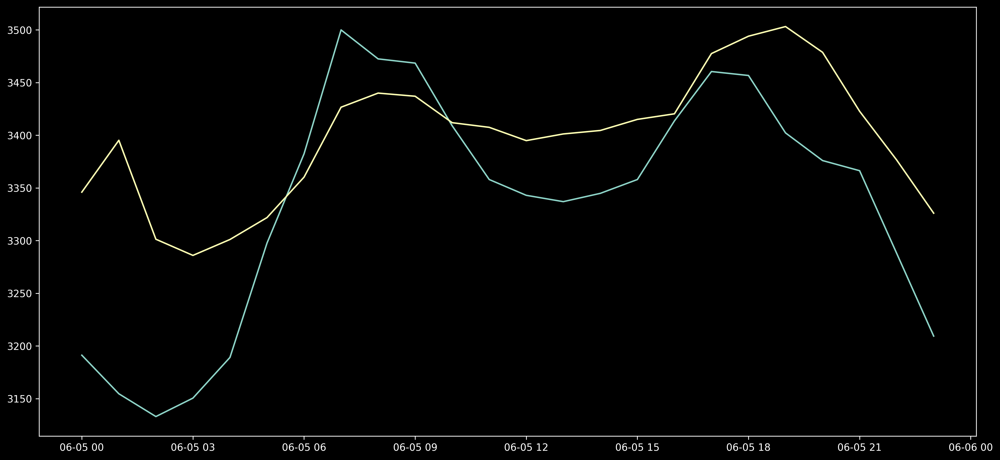

In [116]:
lstm_model = grid_search.best_estimator_.model
lstm_pred = lstm_model.predict(testX)
prediction_copies_array = np.repeat(lstm_pred, 6, axis=-1)
pred=scaler.inverse_transform(np.reshape(prediction_copies_array,(len(lstm_pred),6)))[:,0]

original_copies_array = np.repeat(testY,6, axis=-1)
original=scaler.inverse_transform(np.reshape(original_copies_array,(len(testY),6)))[:,0]

plt.plot(df_lstm_merged['actual'][-24:])
plt.plot(df_lstm_merged.index[-24:], pred[-24:])


In [117]:
grid_search.best_estimator_, grid_search.best_params_

(<keras.wrappers.scikit_learn.KerasRegressor at 0x258047f9d60>,
 {'batch_size': 16, 'epochs': 10, 'optimizer': 'adam'})

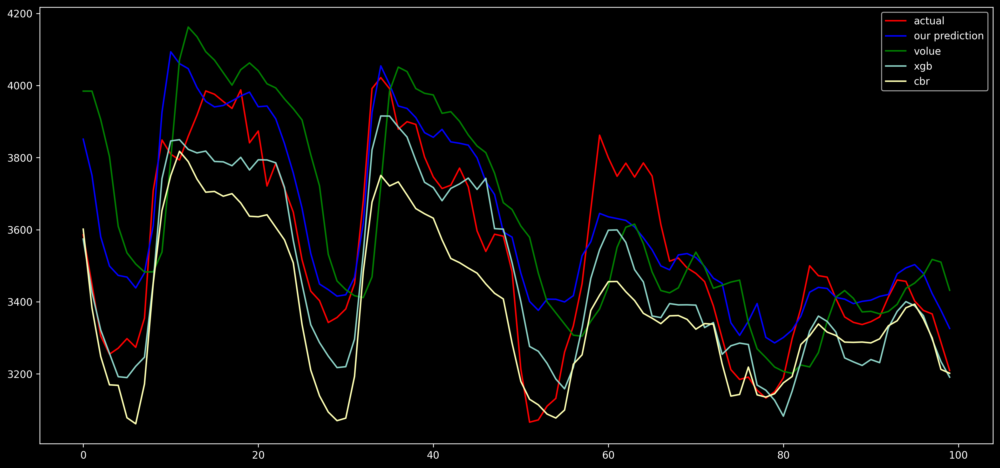

In [118]:
plt.plot(original[-100:], color='red', label='actual')
plt.plot(pred[-100:], color='blue', label = 'our prediction')
plt.plot(range(0,100),df_lstm_merged['volue'][-100:], color='green', label='volue')
# plt.plot(range(0,100), df_lstm_merged['CNPNO1_F'][-100:]*1000, color='yellow', label='skm')
plt.plot(range(0,100), df_lstm_merged['xgb'][-100:], label='xgb')
plt.plot(range(0,100), df_lstm_merged['cbr'][-100:], label='cbr')
plt.legend()

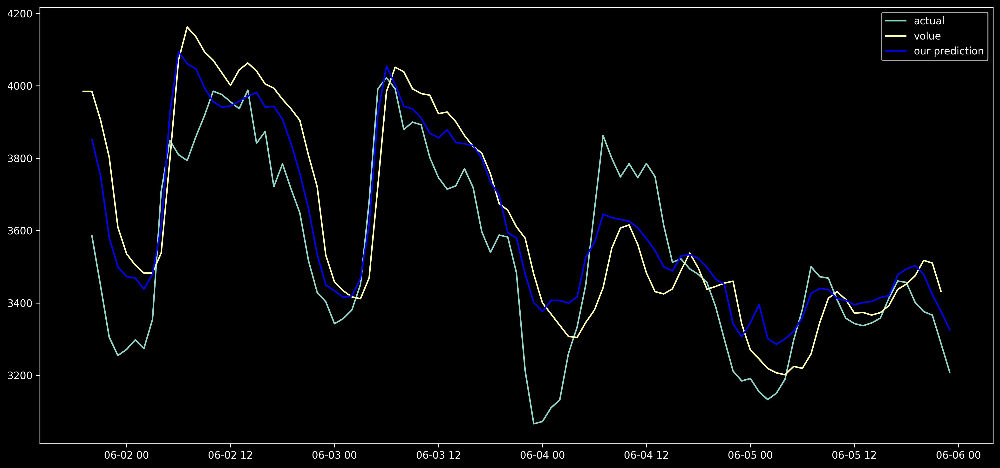

In [119]:
df_lstm_merged_shifted = df_lstm_merged
df_lstm_merged_shifted['volue'].index = df_lstm_merged_shifted['volue'].index - timedelta(hours=1)
df_lstm_merged_shifted['CNPNO1_F'].index = df_lstm_merged_shifted['CNPNO1_F'].index - timedelta(hours=1)
plt.plot(df_lstm_merged['actual'][-100:], label='actual')
# plt.plot(df_lstm_merged_shifted['CNPNO1_F'][-100:]*1000, label='skm')
plt.plot(df_lstm_merged_shifted['volue'][-100:], label='volue')
plt.plot(df_lstm_merged.index[-100:], pred[-100:], color='blue', label = 'our prediction')
plt.legend()

In [120]:

print('LSTM: ')
r2_score_lstm = r2_score(df_lstm_merged['actual'][-pred.shape[0]:], pred)
print(f'R2 score: {round(r2_score_lstm * 100, 1)}%')
mse_lstm = mean_squared_error(df_lstm_merged['actual'][-pred.shape[0]:], pred)
print(f'root_mean_squared_error: {np.sqrt(mse_lstm)}')
adjusted_r2 = 1-((1-r2_score_lstm)*(pred.shape[0]-1)/(pred.shape[0]-trainX.shape[-1]-1))
print(f'adjusted r2 score: {round(adjusted_r2*100, 1)}%')

wmape_lstm = (np.sum(abs(df_lstm_merged['actual'][-pred.shape[0]:] - pred)))/np.sum(abs(df_lstm_merged['actual'][-pred.shape[0]:]))
print(f'WMAPE: {round(wmape_lstm, 2)} (lower is better)')




# consider implementing K-Fold cross-validation

LSTM: 
R2 score: 93.1%
root_mean_squared_error: 149.67286790335984
adjusted r2 score: 93.1%
WMAPE: 0.03 (lower is better)


### Implement Bidirectional LSTM

In [121]:
import math

def preprocess_data(df):
    df_scaled = df
    dataset = df.values
    print(dataset.shape)
    #standardization
    #mean = np.mean(dataset, axis=0)
    #stddev = np.std(dataset, axis=0)
    #dataset = (dataset - mean) / stddev
    scaler = StandardScaler()
    scaler.fit(df)
    dataset = scaler.transform(df_scaled)

    print(dataset.shape)

    def split_sequence(sequence, n_steps):
        """
        This function splits the dataset sequence into input data and labels
        """

        X, y  = [], []
        for i in range(sequence.shape[0]):
            if(i + n_steps) >= sequence.shape[0]:
                break
            #Divide sequence between data (input) and labels (output)
            seq_X, seq_Y = sequence[i: i + n_steps, 1:], sequence[i + n_steps, 0]
            X.append(seq_X)
            y.append(seq_Y)
        return np.array(X), np.array(y)
    
    # Create training and validation datasets
    dataset_size = dataset.shape[0]
    x_train, y_train = split_sequence(dataset[0: math.ceil(0.7 *
                                    dataset_size), :], 24)
    x_val, y_val = split_sequence(dataset[math.floor(0.7 *
                                dataset_size):], 24)
    
    print(x_train.shape)
    print(y_train.shape)
    return dataset, df, x_train, y_train, x_val, y_val

In [122]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Bidirectional, Dense

In [123]:

# Batch and shuffle data
dataset, df, x_train, y_train, x_val, y_val = preprocess_data(df_lstm_merged)

batch_size = 100
buffer_size = x_train.shape[0]

# Provide an infinite dataset
train_iterator = tf.data.Dataset.from_tensor_slices((x_train, y_train)).shuffle(buffer_size).batch(batch_size).repeat()
# Provide an infinite dataset
val_iterator = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(batch_size).repeat()

(21266, 6)
(21266, 6)
(14863, 24, 5)
(14863,)


In [124]:
n_steps = x_train.shape[-2]
n_features = x_train.shape[-1]
# Define the model
model = Sequential()
model.add(Bidirectional(LSTM(64, activation='relu', input_shape=(n_steps, n_features), return_sequences=True)))
model.add(LSTM(64, activation='relu'))
model.add(Dense(1))
# Compile the model
model.compile(optimizer='adam', loss='mse')

epochs = 5
steps_per_epoch = 800
validation_steps = 80
# Train with an infinite dataset
history = model.fit(train_iterator, epochs=epochs,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=val_iterator,
                    validation_steps=validation_steps)
print('=======================')
model.summary()

Epoch 1/5
800/800 [==============================] - 35s 41ms/step - loss: 0.0688 - val_loss: 0.0932
Epoch 2/5
800/800 [==============================] - 28s 34ms/step - loss: 0.0350 - val_loss: 0.0741
Epoch 3/5
800/800 [==============================] - 30s 37ms/step - loss: 0.0310 - val_loss: 0.0834
Epoch 4/5
800/800 [==============================] - 28s 35ms/step - loss: 0.0282 - val_loss: 0.3303
Epoch 5/5
800/800 [==============================] - 27s 34ms/step - loss: 0.0255 - val_loss: 0.2602
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_1 (Bidirectio  (None, 24, 128)          35840     
 nal)                                                            
                                                                 
 lstm_15 (LSTM)              (None, 64)                49408     
                                                                 
 dense_7 (D

4/4 [==============================] - 0s 5ms/step


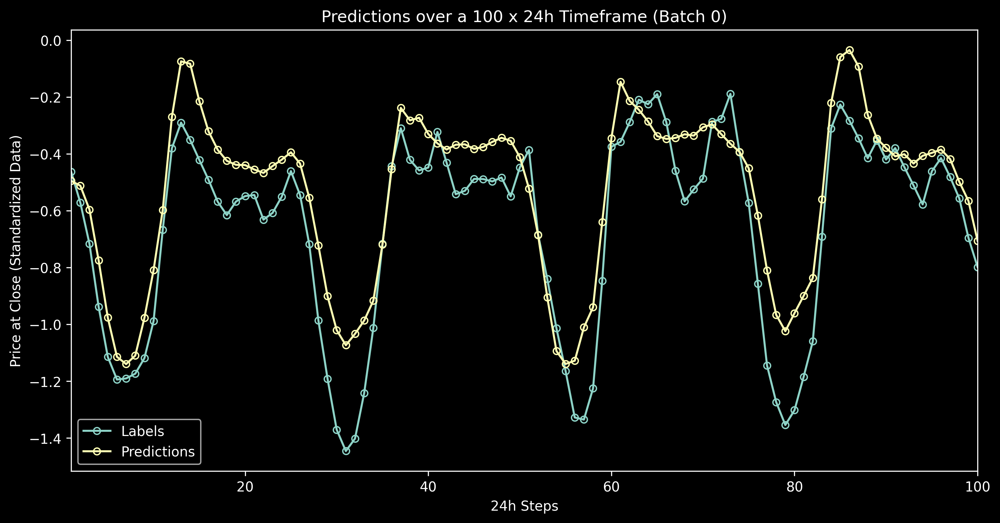

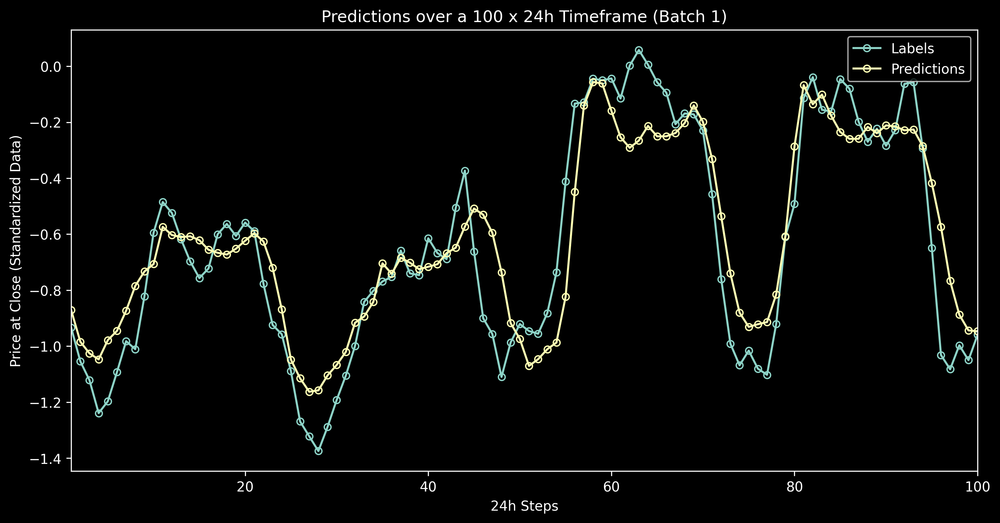

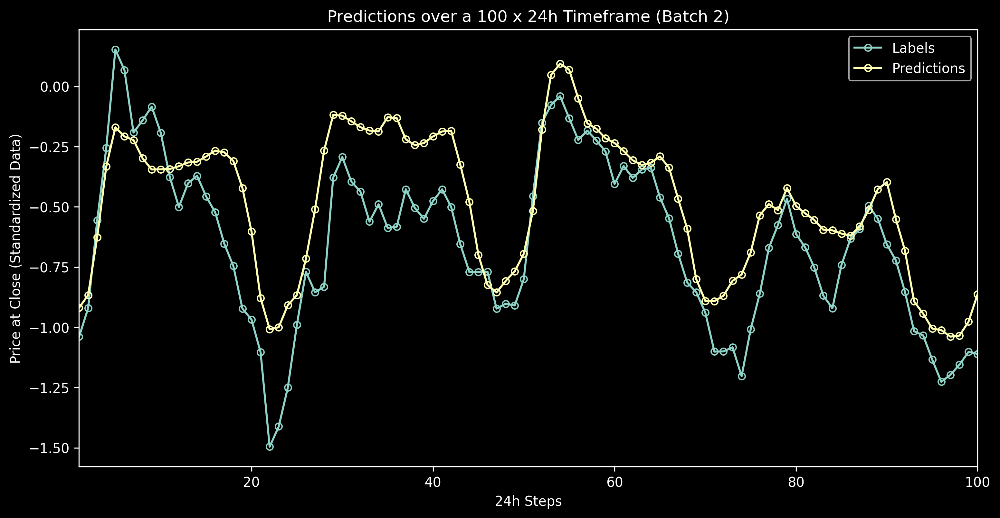

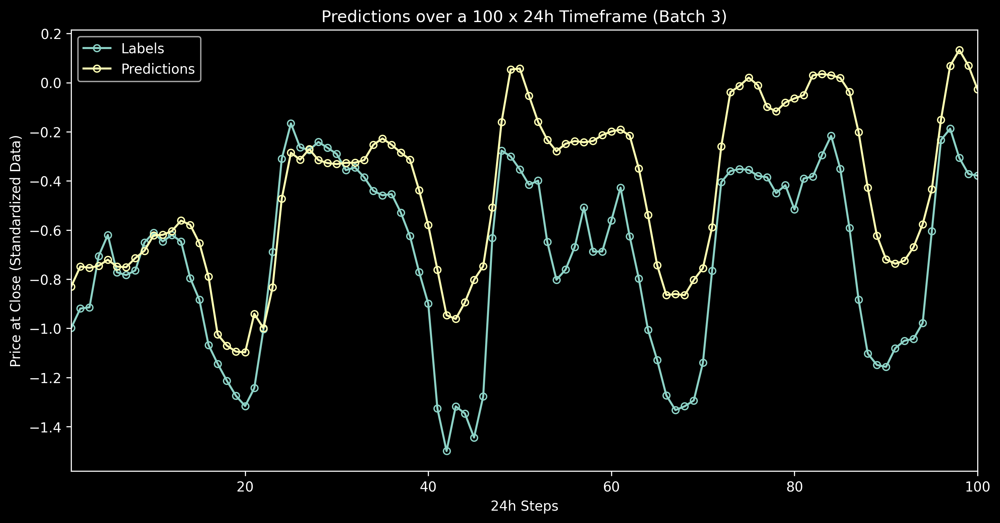

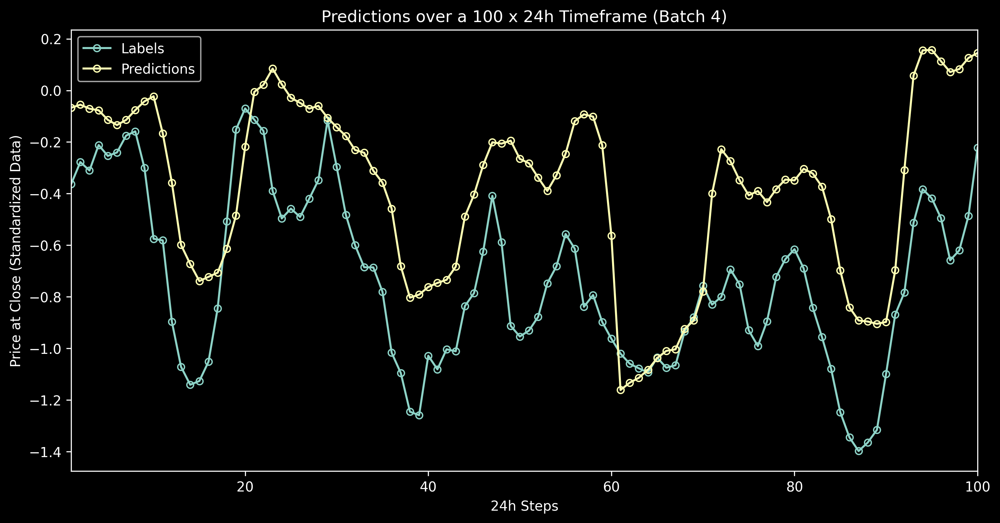

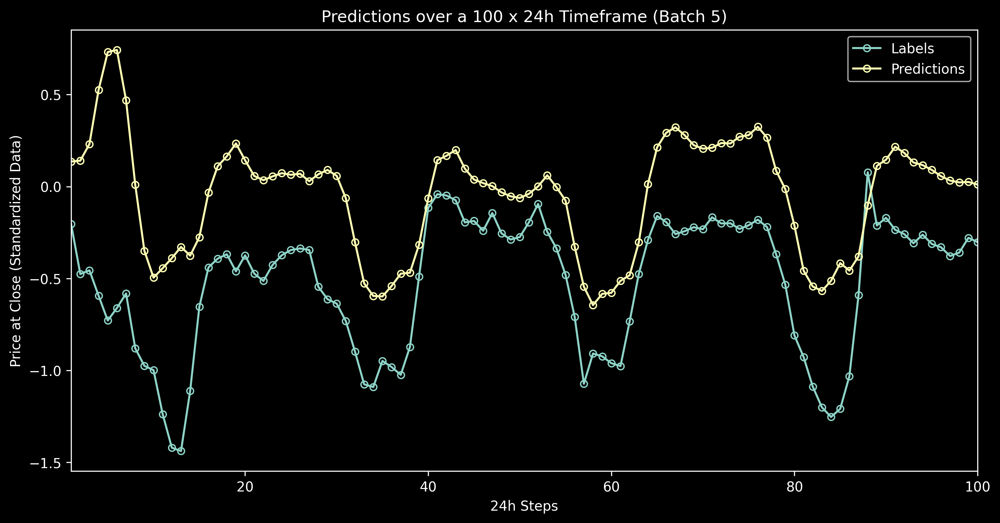

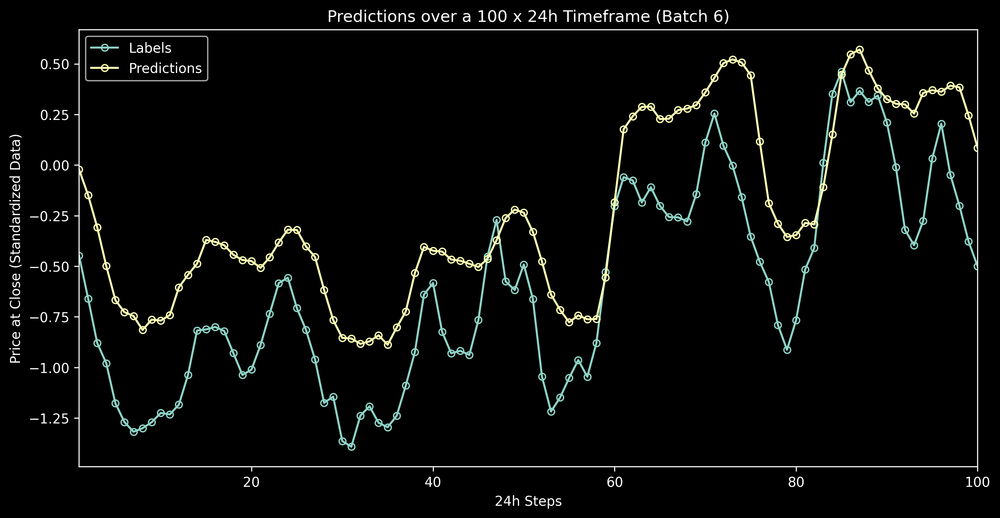

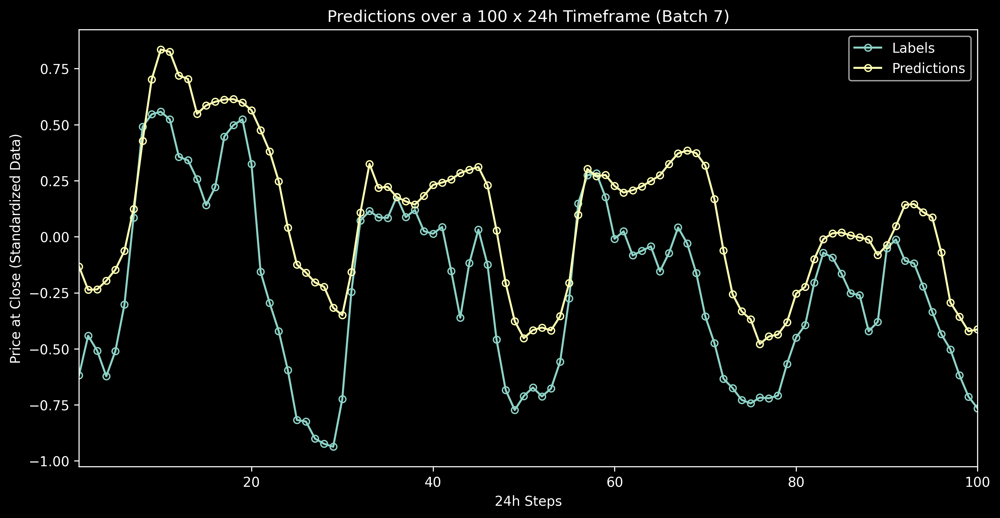

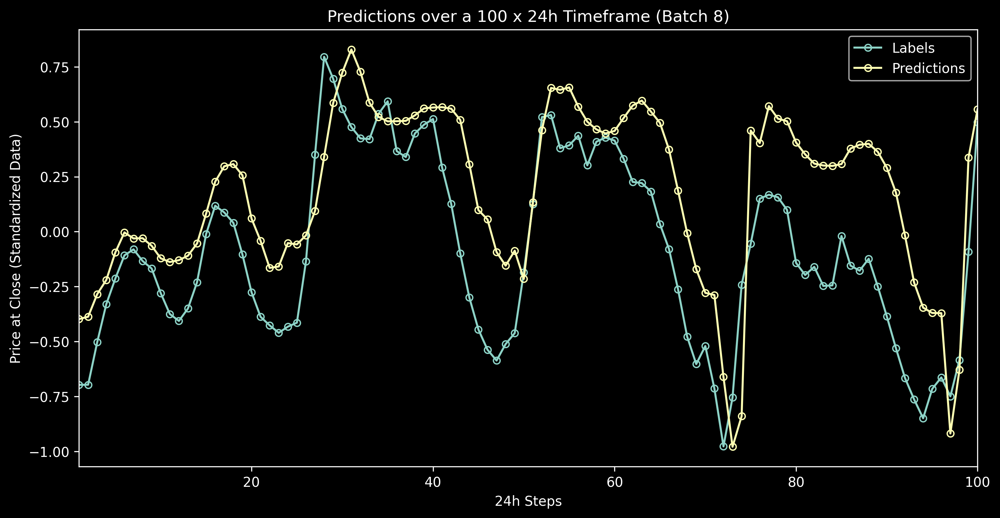

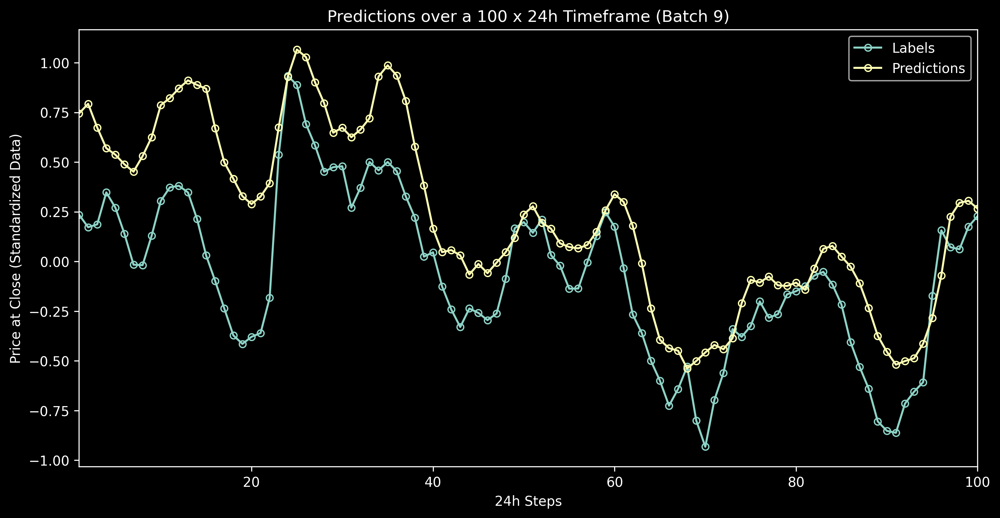

In [125]:
def plot_3(future, prediction, title):
  """function that plots predictions over "batch_size" x 24h 
  timeframes"""
  days = list(range(1, future.shape[0] + 1))
  plt.figure(figsize=(12, 6))
  plt.plot(days, future, 'o-', markersize=5, mfc='none', 
  label='Labels')
  plt.plot(days, prediction, 'o-', markersize=5, mfc='none', 
  label='Predictions')
  plt.title(title)
  plt.xlim([days[0], days[-1]])
  plt.xlabel('24h Steps')
  plt.ylabel('Price at Close (Standardized Data)')
  plt.legend()
  plt.show    

# Make predictions over "batch_size" x 24h timeframes
string = 'Predictions over a {} x 24h Timeframe (Batch {})'
for batch_num, (x, y) in enumerate(val_iterator.take(10)):
  title = string.format(batch_size, batch_num)
  plot_3(y.numpy(),
         model.predict(x).reshape(-1),
         title)
  batch_num += 1

# Predict in a way that i understand

In [126]:
last_day = df_lstm_merged[-24:]

def preprocess_x(df):
    df_scaled = df
    dataset = df.values
    print(dataset.shape)
    #standardization
    #mean = np.mean(dataset, axis=0)
    #stddev = np.std(dataset, axis=0)
    #dataset = (dataset - mean) / stddev
    scaler = StandardScaler()
    scaler.fit(df)
    dataset = scaler.transform(df_scaled)

    print(dataset.shape)

    sequence = dataset[0: math.ceil(0.7 * dataset.shape[0]), :]
    X, y  = [], []
    for i in range(sequence.shape[0]):
        if(i + n_steps) >= sequence.shape[0]:
            break
        #Divide sequence between data (input) and labels (output)
        seq_X, seq_Y = sequence[i: i + n_steps, 1:], sequence[i + n_steps, 0]
        X.append(seq_X)
        y.append(seq_Y)

    return np.array(X), np.array(y)


In [127]:
last_day_x, last_day_y = preprocess_x(last_day)
last_day_pred = model.predict(last_day_x)

plt.plot(last_day.index, last_day_pred, label="prediction")
plt.plot(last_day['actual'], label='actual')
plt.legend()

(24, 6)
(24, 6)


ValueError: Unexpected result of `predict_function` (Empty batch_outputs). Please use `Model.compile(..., run_eagerly=True)`, or `tf.config.run_functions_eagerly(True)` for more information of where went wrong, or file a issue/bug to `tf.keras`.